In [5]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('D:/Dataset/parkinson'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        

D:/Dataset/parkinson\parkinsons.data


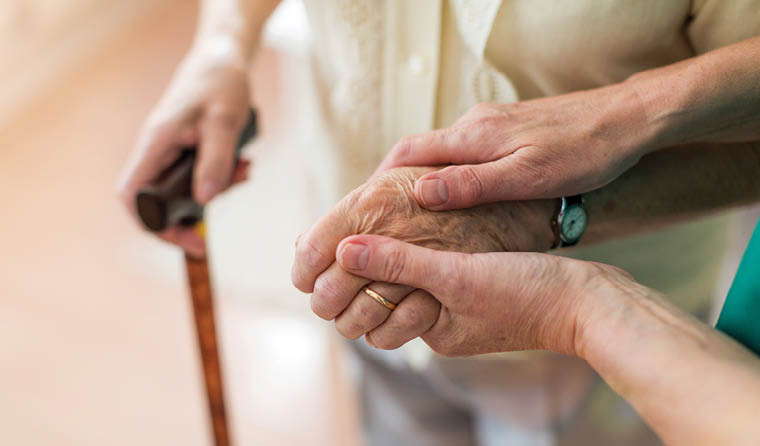

In [6]:
from PIL import Image
from IPython.display import display

# Provide the full path to the image
img = Image.open("D:/Header.jpg")  # Adjust the filename if needed
display(img)


In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from termcolor import colored
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix, roc_curve, auc

In [11]:

data = pd.read_csv(r'D:\Dataset\Parkinson\parkinsons.data')


In [12]:
data.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [14]:
data.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [15]:
data.isna().sum()

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64

In [16]:
data.columns

Index(['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

In [17]:
data.duplicated().sum()

0

In [18]:
data["status"].value_counts()    

status
1    147
0     48
Name: count, dtype: int64

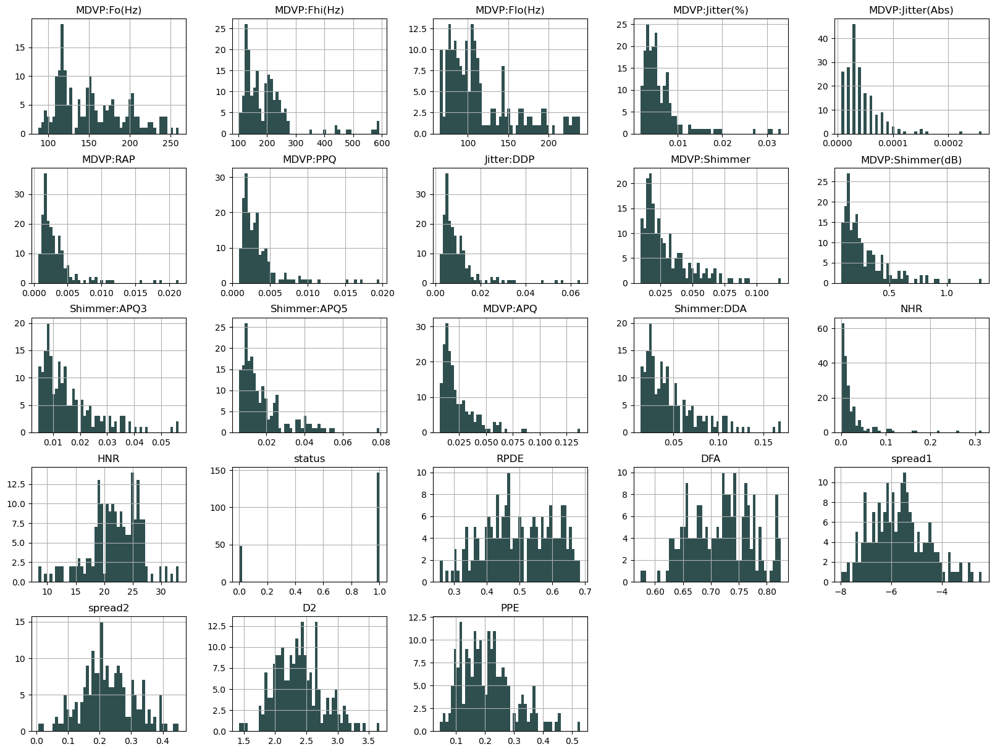

In [25]:
data.hist(bins=50, figsize =(20,15), color = 'darkslategrey')
plt.show(block=False)

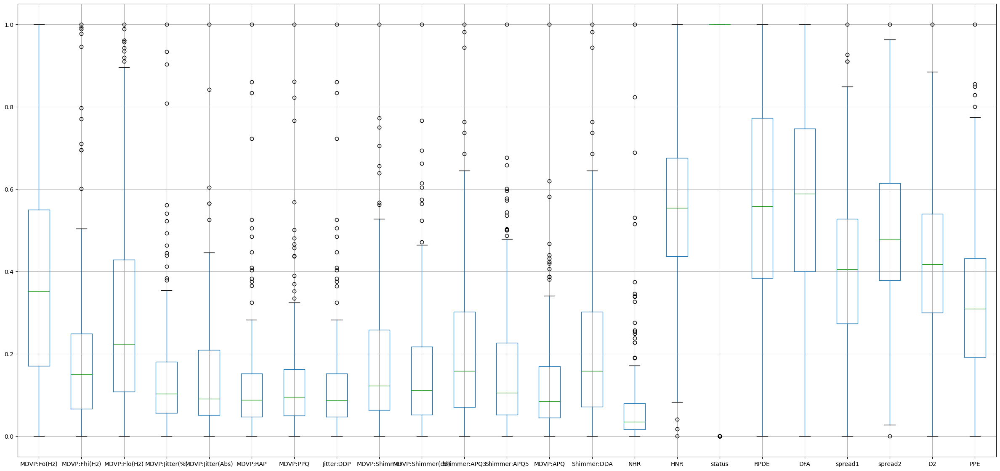

In [27]:
minmax = MinMaxScaler()
data_boxplot = data.drop(['name'],axis=1)
data_boxplot = minmax.fit_transform(data_boxplot)
boxplot = pd.DataFrame(data_boxplot, columns = data.drop(['name'],axis=1).columns)
boxplot.boxplot(figsize=(30,14))
plt.show(block=False)

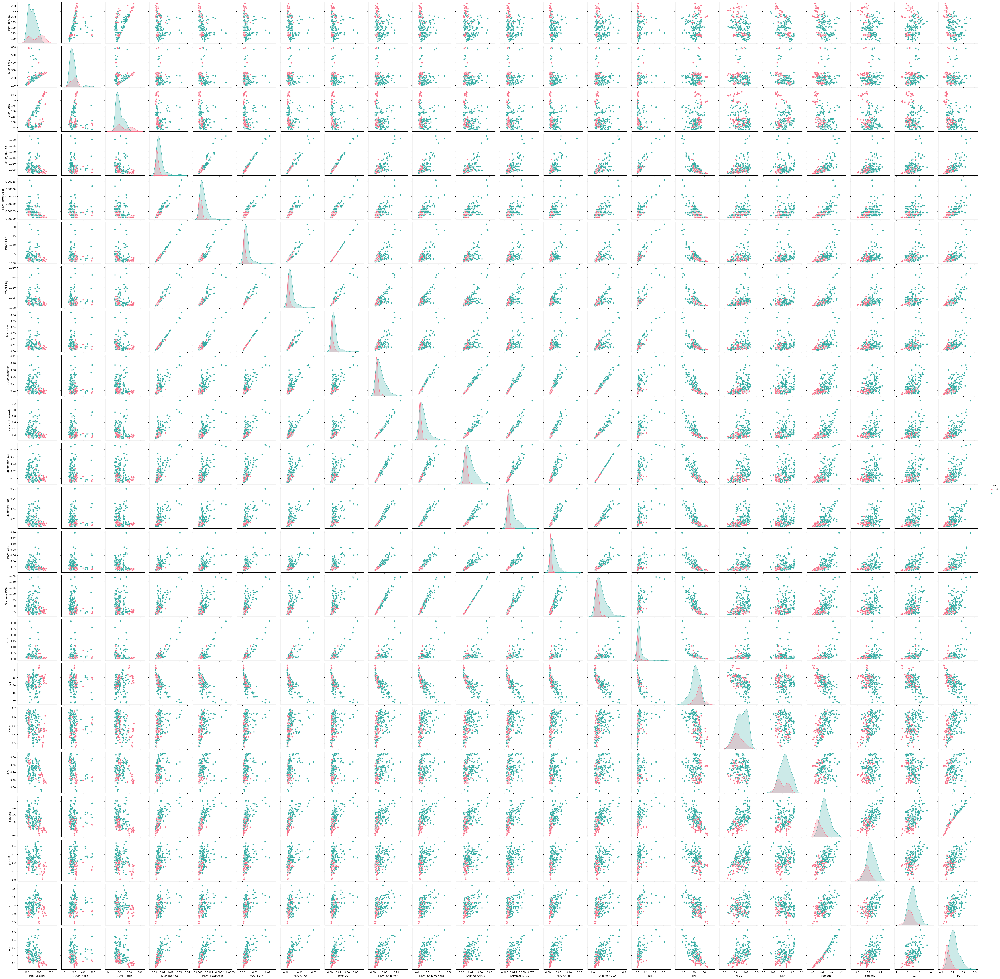

In [28]:
sns.pairplot(data, hue='status', palette='husl')  # 'status' (0 = Healthy, 1 = Parkinson's)
plt.show()


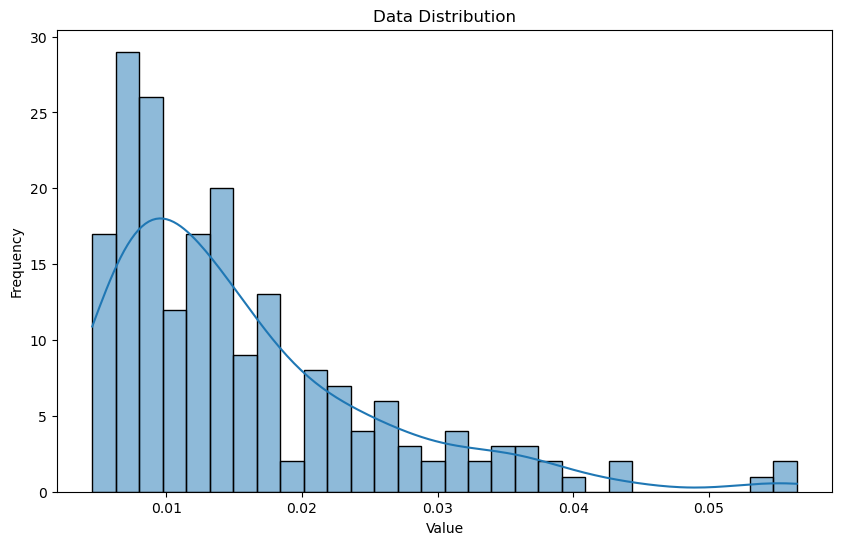

In [31]:
data.dropna(inplace=True)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
plt.figure(figsize=(10, 6))
sns.histplot(data['Shimmer:APQ3'], kde=True, bins=30)
plt.title('Data Distribution')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

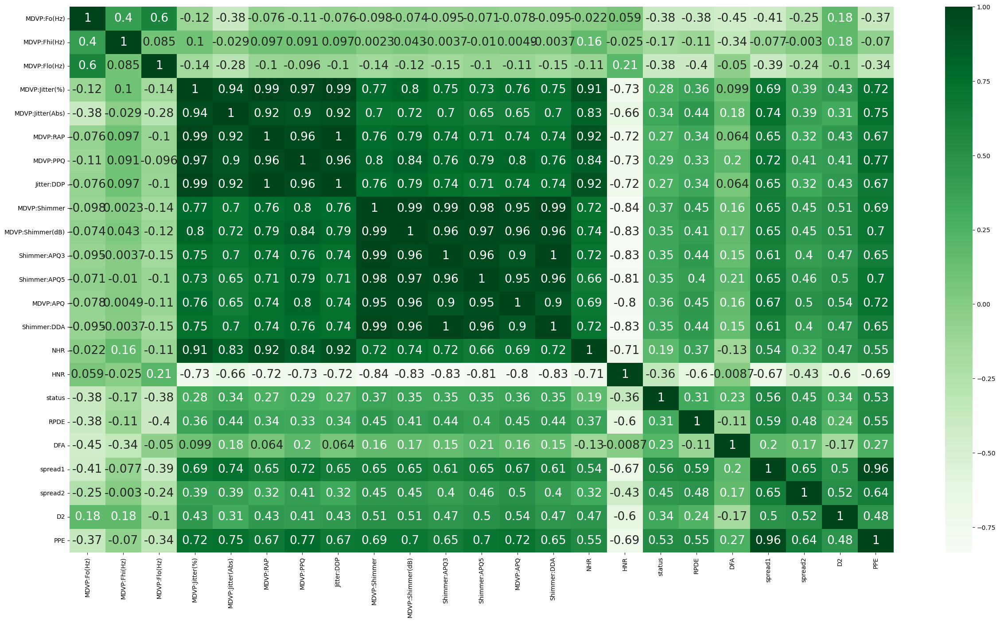

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns for correlation calculation
numeric_data = data.select_dtypes(include=['number'])

plt.figure(figsize=(30,16))
sns.heatmap(numeric_data.corr(), annot=True, cmap='Greens', annot_kws={'size':19})
plt.show()


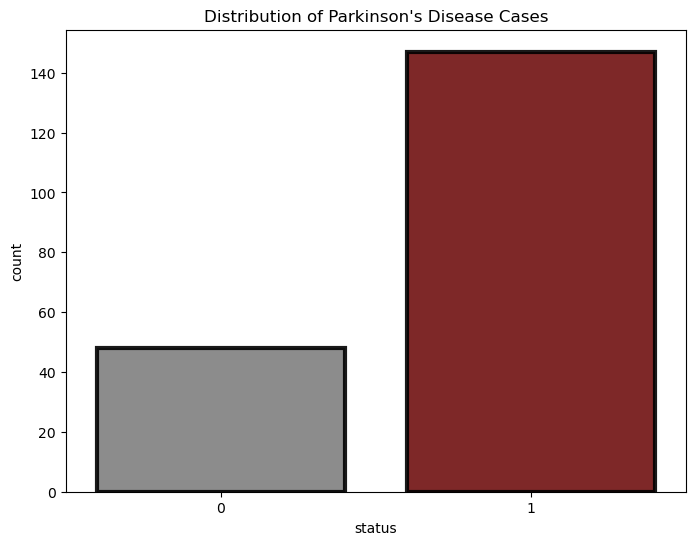

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.countplot(data=data, x='status', hue='status', palette=['grey', 'maroon'], edgecolor='black', linewidth=3, alpha=0.9)
plt.legend([],[], frameon=False)  # Hide legend if not needed
plt.title("Distribution of Parkinson's Disease Cases")
plt.show()


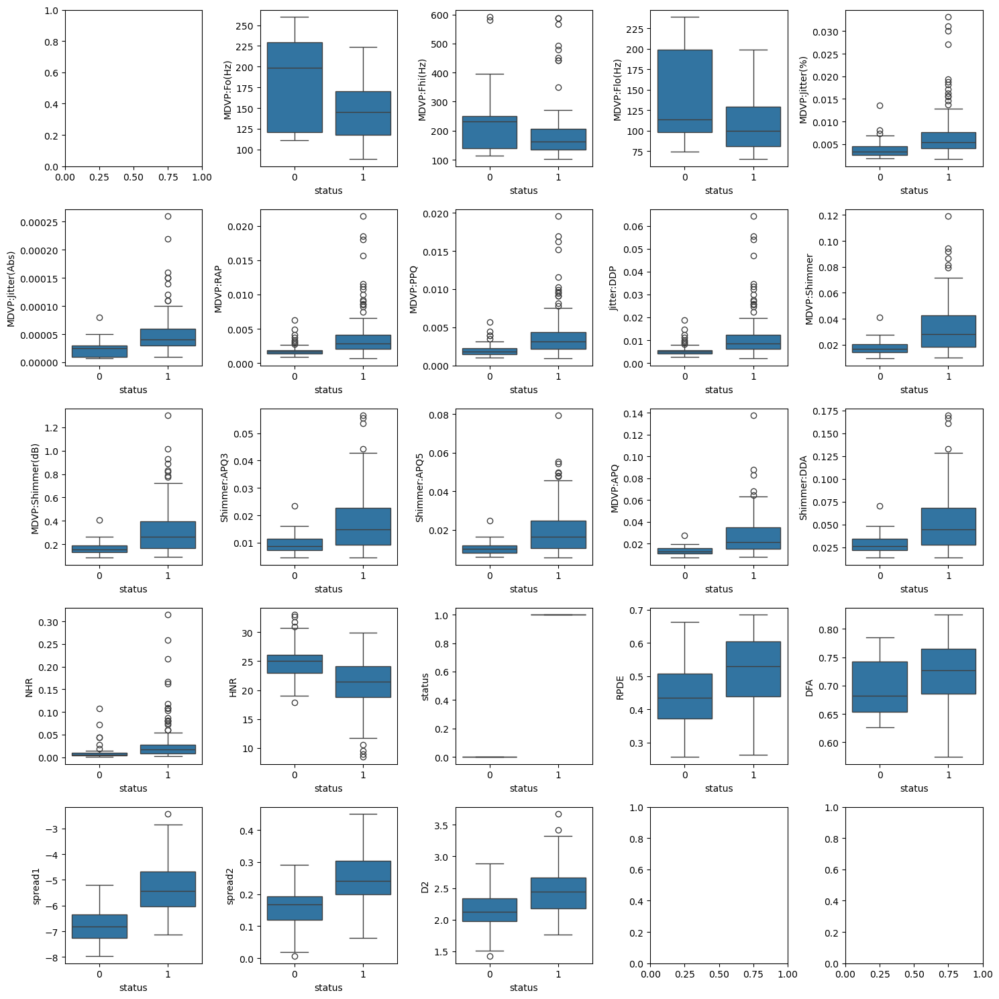

In [45]:
fig,axes=plt.subplots(5,5,figsize=(15,15))
axes=axes.flatten()

for i in range(1,len(data.columns)-1):
    sns.boxplot(x='status',y=data.iloc[:,i],data=data,orient='v',ax=axes[i])
plt.tight_layout()
plt.show()

In [46]:
X=data.drop(['name','status'],axis=1)
y=data["status"]

In [47]:
smote_sampler = SMOTE(random_state=42)
X_smote, y_smote = smote_sampler.fit_resample(X, y)
smote_data = pd.concat([X_smote, y_smote], axis=1)
smote_data.shape

(294, 23)

In [48]:
len(smote_data[smote_data.status==1].value_counts())

147

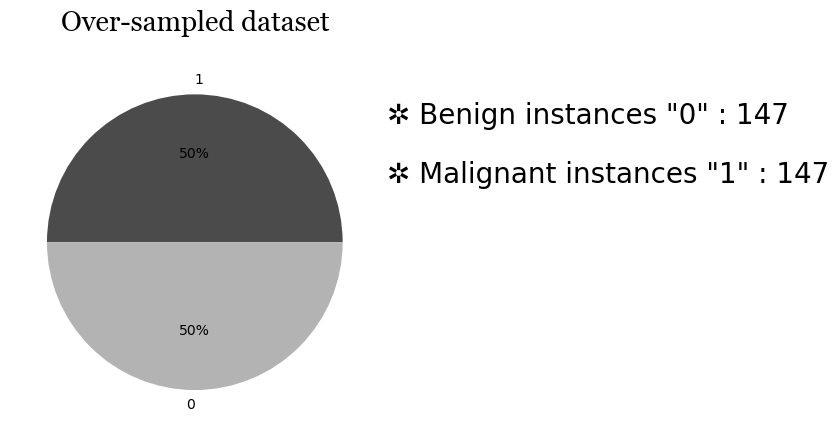

In [53]:
num_status=smote_data['status'].value_counts()
over_counts = num_status.values
plt.pie(num_status, labels=num_status.index.values, colors=[ (0.29296875,0.29296875,0.29296875), (0.703125,0.703125,0.703125)]
        , autopct='%d%%')
plt.title('Over-sampled dataset', y=1.05, fontsize=20, fontfamily='Georgia')
plt.text(x=1.3, y=0.8, s=f'✲ Benign instances "0" : {len(smote_data[smote_data.status==0].value_counts())}', fontsize=20)
plt.text(x=1.3, y=0.4, s=f'✲ Malignant instances "1" : {len(smote_data[smote_data.status==1].value_counts())}', fontsize=20)
plt.show(block=False)

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [55]:
X_smote_train, X_smote_test, y_smote_train, y_smote_test = train_test_split(X_smote, y_smote, train_size=0.8, random_state=42)

In [58]:
minmax = MinMaxScaler()

In [59]:
X_train_scaled = minmax.fit_transform(X_train)
X_test_scaled = minmax.transform(X_test)

In [60]:
X_smote_train_scaled = minmax.fit_transform(X_smote_train)
X_smote_test_scaled = minmax.transform(X_smote_test)

In [61]:
def Evaluate_Performance(Model, Xtrain, Xtest, Ytrain, Ytest):  
    """Evaluate model performance with detailed metrics and visualization."""  
    from sklearn.metrics import classification_report, roc_auc_score  
    
    # Train the model
    Model.fit(Xtrain, Ytrain)

    # Cross-validation score
    overall_score = cross_val_score(Model, Xtrain, Ytrain, cv=10, scoring='accuracy')
    model_score = np.average(overall_score)

    # Predictions
    Ypredicted = Model.predict(Xtest)
    Ypred_proba = Model.predict_proba(Xtest)[:, 1] if hasattr(Model, "predict_proba") else None
    
    # Accuracy Metrics
    training_acc = round(Model.score(Xtrain, Ytrain) * 100, 2)
    testing_acc = round(accuracy_score(Ytest, Ypredicted) * 100, 2)
    precision = round(precision_score(Ytest, Ypredicted) * 100, 2)
    recall = round(recall_score(Ytest, Ypredicted) * 100, 2)
    f1 = round(f1_score(Ytest, Ypredicted) * 100, 2)
    auc_roc = round(roc_auc_score(Ytest, Ypred_proba) * 100, 2) if Ypred_proba is not None else "N/A"

    # Print Model Evaluation Metrics
    print("\n📊 MODEL PERFORMANCE SUMMARY")
    print("=" * 50)
    print(f" ✅ Training Accuracy  : {training_acc}%")
    print(f" ✅ Cross-Validation   : {round(model_score * 100, 2)}%")
    print(f" ✅ Testing Accuracy   : {testing_acc}%")
    print(f" 🔹 Precision Score    : {precision}%")
    print(f" 🔹 Recall Score       : {recall}%")
    print(f" 🔹 F1 Score           : {f1}%")
    print(f" 🔹 AUC-ROC Score      : {auc_roc}%")
    print("=" * 50)
    
    # Classification Report
    print("\n📌 Classification Report:\n")
    print(classification_report(Ytest, Ypredicted))

    # Confusion Matrix
    conf_matrix = confusion_matrix(Ytest, Ypredicted)
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", annot_kws={"size": 16}, cbar=False)
    plt.xlabel("Predicted Labels", fontsize=14, fontweight="bold")
    plt.ylabel("True Labels", fontsize=14, fontweight="bold")
    plt.title("Confusion Matrix", fontsize=16, fontweight="bold", pad=10)
    plt.show()

    # AUC-ROC Curve
    if Ypred_proba is not None:
        fpr, tpr, _ = roc_curve(Ytest, Ypred_proba)
        plt.figure(figsize=(6, 4))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {auc_roc}%')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate', fontsize=14, fontweight="bold")
        plt.ylabel('True Positive Rate', fontsize=14, fontweight="bold")
        plt.title('ROC Curve', fontsize=16, fontweight="bold", pad=10)
        plt.legend(loc="lower right")
        plt.grid()
        plt.show()


--------------------------------------------------------------------------------
Logistic Regression :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 85.26%
 ✅ Cross-Validation   : 83.87%
 ✅ Testing Accuracy   : 89.74%
 🔹 Precision Score    : 88.89%
 🔹 Recall Score       : 100.0%
 🔹 F1 Score           : 94.12%
 🔹 AUC-ROC Score      : 85.27%

📌 Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.43      0.60         7
           1       0.89      1.00      0.94        32

    accuracy                           0.90        39
   macro avg       0.94      0.71      0.77        39
weighted avg       0.91      0.90      0.88        39



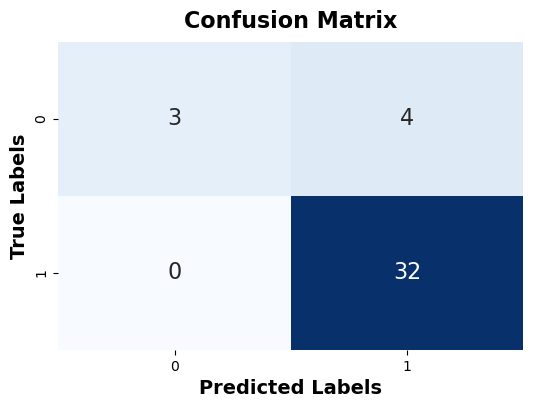

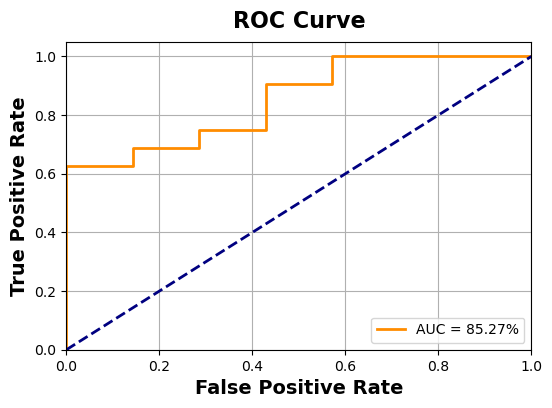

In [62]:
LR = LogisticRegression()
LR.fit(X_train_scaled,y_train)
y_pred_LR = LR.predict(X_test_scaled)
print('-'*80)
print("Logistic Regression :")
print("-"*16)
Evaluate_Performance(LR, X_train_scaled, X_test_scaled, y_train, y_test)

--------------------------------------------------------------------------------
Decision Tree Classifier :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 100.0%
 ✅ Cross-Validation   : 88.46%
 ✅ Testing Accuracy   : 89.74%
 🔹 Precision Score    : 93.75%
 🔹 Recall Score       : 93.75%
 🔹 F1 Score           : 93.75%
 🔹 AUC-ROC Score      : 82.59%

📌 Classification Report:

              precision    recall  f1-score   support

           0       0.71      0.71      0.71         7
           1       0.94      0.94      0.94        32

    accuracy                           0.90        39
   macro avg       0.83      0.83      0.83        39
weighted avg       0.90      0.90      0.90        39



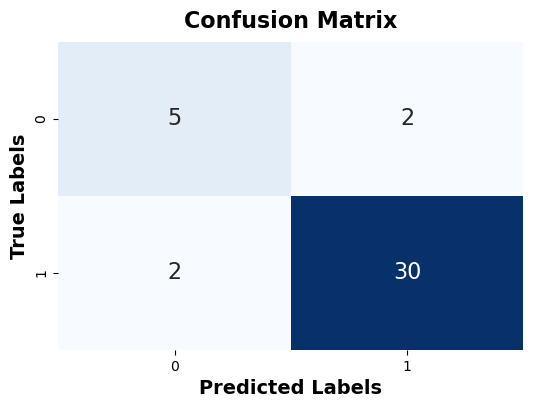

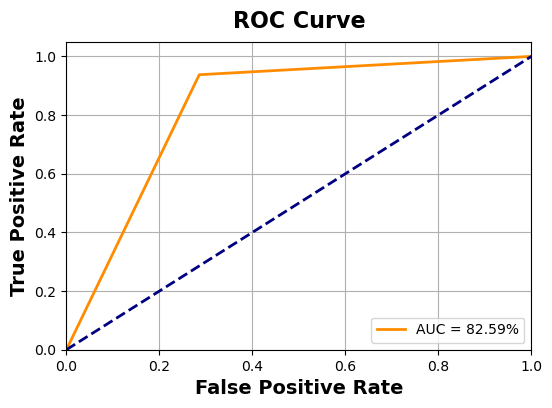



DECISION TREE :


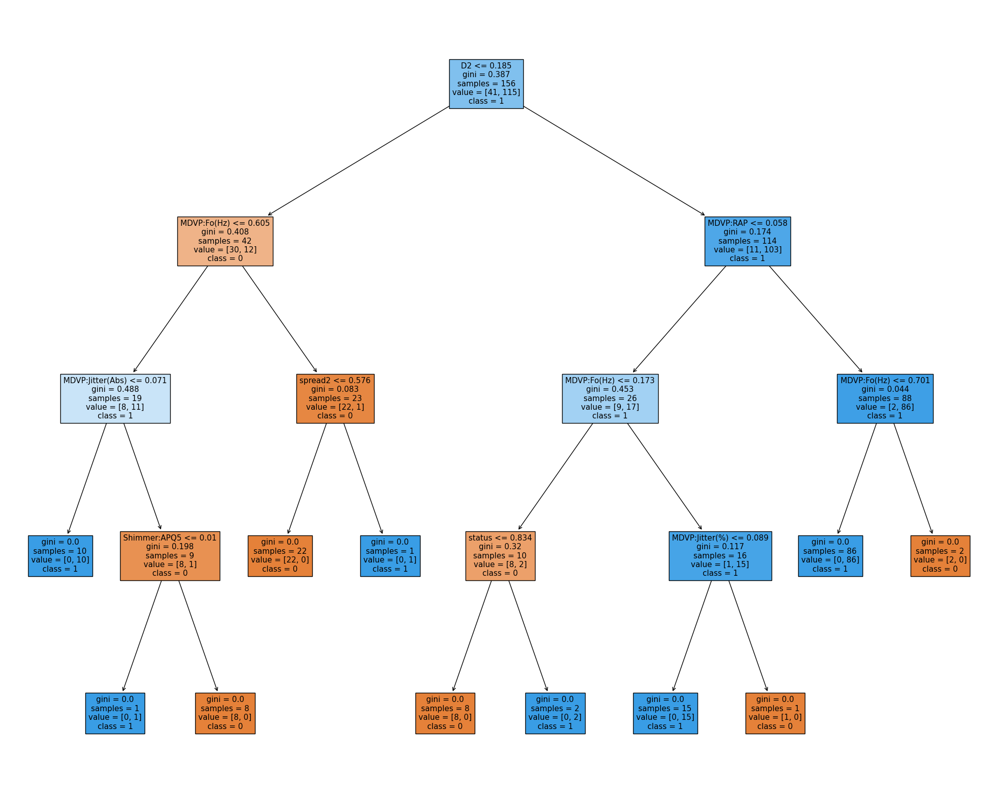

In [66]:
DTC=DecisionTreeClassifier()
DTC.fit(X_train_scaled, y_train)
y_pred_DTC = DTC.predict(X_test_scaled)
print('-'*80)
print('Decision Tree Classifier :')
print("-"*16)
Evaluate_Performance(DTC, X_train_scaled, X_test_scaled, y_train, y_test)
print('\n')
print("DECISION TREE :")
fig = plt.figure(figsize=(25,20))
tree = plot_tree(DTC, feature_names = [ c for c in data.drop(['name'],axis=1).columns], class_names=['0','1'], filled=True)

--------------------------------------------------------------------------------
Support Vector Machine:
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 88.46%
 ✅ Cross-Validation   : 87.67%
 ✅ Testing Accuracy   : 89.74%
 🔹 Precision Score    : 88.89%
 🔹 Recall Score       : 100.0%
 🔹 F1 Score           : 94.12%
 🔹 AUC-ROC Score      : 79.91%

📌 Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.43      0.60         7
           1       0.89      1.00      0.94        32

    accuracy                           0.90        39
   macro avg       0.94      0.71      0.77        39
weighted avg       0.91      0.90      0.88        39



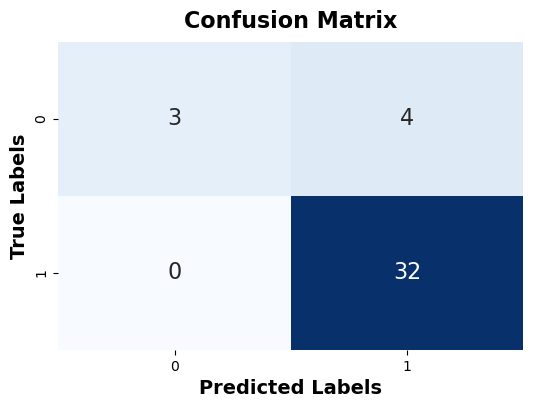

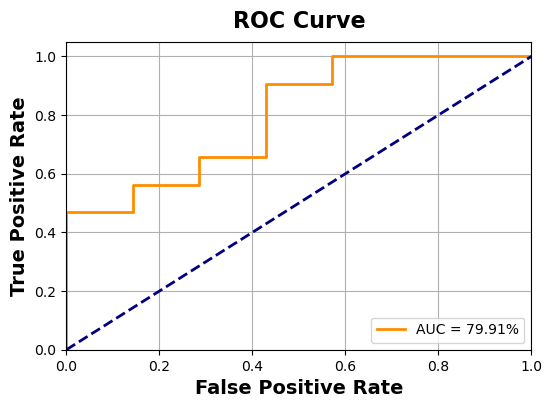

In [65]:
SVM = SVC(probability=True, kernel = 'linear')
SVM.fit(X_train_scaled,y_train)
y_pred_SVM = SVM.predict(X_test_scaled)
print('-'*80)
print("Support Vector Machine:")
print("-"*16)
Evaluate_Performance(SVM, X_train_scaled, X_test_scaled, y_train, y_test)

--------------------------------------------------------------------------------
Random Forest Classifier
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 100.0%
 ✅ Cross-Validation   : 89.67%
 ✅ Testing Accuracy   : 94.87%
 🔹 Precision Score    : 94.12%
 🔹 Recall Score       : 100.0%
 🔹 F1 Score           : 96.97%
 🔹 AUC-ROC Score      : 93.75%

📌 Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.71      0.83         7
           1       0.94      1.00      0.97        32

    accuracy                           0.95        39
   macro avg       0.97      0.86      0.90        39
weighted avg       0.95      0.95      0.95        39



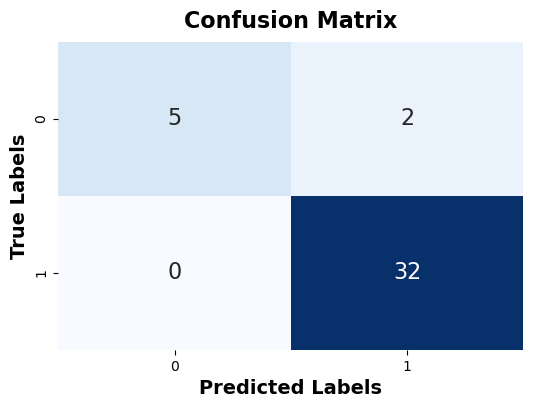

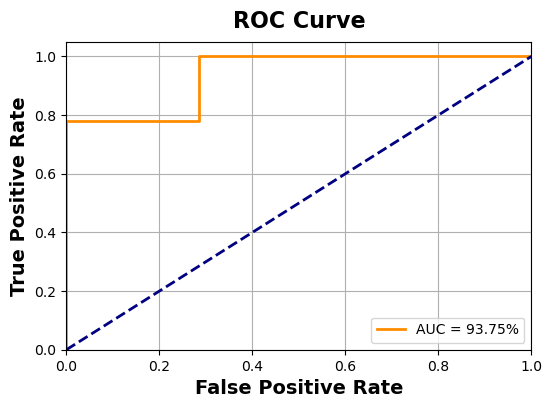

In [67]:
RFC=RandomForestClassifier(n_estimators=150)
RFC.fit(X_train_scaled, y_train)
y_pred_RFC = RFC.predict(X_test_scaled)
print('-'*80)
print('Random Forest Classifier')
print("-"*16)
Evaluate_Performance(RFC, X_train_scaled, X_test_scaled, y_train, y_test)

--------------------------------------------------------------------------------
Key- Nearest Neighbor :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 96.79%
 ✅ Cross-Validation   : 89.79%
 ✅ Testing Accuracy   : 94.87%
 🔹 Precision Score    : 94.12%
 🔹 Recall Score       : 100.0%
 🔹 F1 Score           : 96.97%
 🔹 AUC-ROC Score      : 98.21%

📌 Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.71      0.83         7
           1       0.94      1.00      0.97        32

    accuracy                           0.95        39
   macro avg       0.97      0.86      0.90        39
weighted avg       0.95      0.95      0.95        39



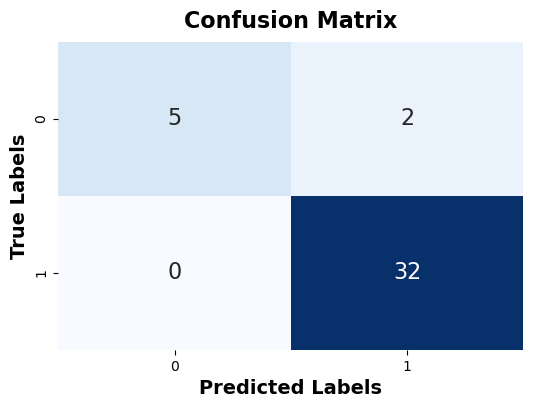

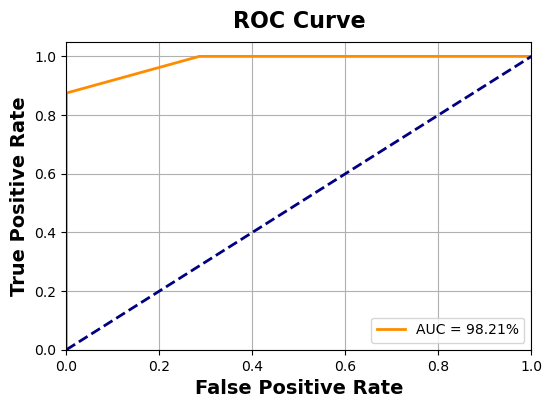

In [68]:
KNN = KNeighborsClassifier()
KNN.fit(X_train_scaled, y_train)
y_pred_KNN = KNN.predict(X_test_scaled)
print('-'*80)
print("Key- Nearest Neighbor :")
print("-"*16)
Evaluate_Performance(KNN, X_train_scaled, X_test_scaled, y_train, y_test)

In [69]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

# Define parameter grid for tuning
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # Testing different numbers of neighbors
    'weights': ['uniform', 'distance'],  # Try both weighting methods
    'metric': ['euclidean', 'manhattan', 'minkowski']  # Different distance metrics
}

# Initialize KNN model
knn = KNeighborsClassifier()

# GridSearchCV to find the best parameters
grid_search = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters
best_knn = grid_search.best_estimator_
print("\n🔹 Best Parameters Found: ", grid_search.best_params_)

# Evaluate performance on test data
y_pred_best_knn = best_knn.predict(X_test_scaled)

# Print accuracy and classification report
from sklearn.metrics import classification_report, accuracy_score
print("\n✅ Optimized KNN Accuracy: ", round(accuracy_score(y_test, y_pred_best_knn) * 100, 2), "%")
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred_best_knn))


Fitting 10 folds for each of 30 candidates, totalling 300 fits

🔹 Best Parameters Found:  {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}

✅ Optimized KNN Accuracy:  97.44 %

📊 Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.86      0.92         7
           1       0.97      1.00      0.98        32

    accuracy                           0.97        39
   macro avg       0.98      0.93      0.95        39
weighted avg       0.98      0.97      0.97        39



In [70]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

# Initialize a Random Forest model for feature selection
feature_selector = RFE(RandomForestClassifier(n_estimators=100, random_state=42), n_features_to_select=10)
X_rfe = feature_selector.fit_transform(X_smote_train_scaled, y_smote_train)

# Get selected features
selected_features = X.columns[feature_selector.support_]
print("\n✅ Selected Features:\n", list(selected_features))



✅ Selected Features:
 ['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Shimmer', 'Shimmer:APQ5', 'MDVP:APQ', 'spread1', 'spread2', 'D2', 'PPE']


In [71]:
from xgboost import XGBClassifier

# Train XGBoost with optimal features
xgb_model = XGBClassifier(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)
xgb_model.fit(X_rfe, y_smote_train)

# Evaluate on test data (using the same selected features)
X_test_rfe = feature_selector.transform(X_smote_test_scaled)
y_pred_xgb = xgb_model.predict(X_test_rfe)

# Print performance metrics
from sklearn.metrics import classification_report, accuracy_score
print("\n✅ XGBoost Accuracy:", round(accuracy_score(y_smote_test, y_pred_xgb) * 100, 2), "%")
print("\n📊 Classification Report:\n", classification_report(y_smote_test, y_pred_xgb))



✅ XGBoost Accuracy: 98.31 %

📊 Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98        30
           1       0.97      1.00      0.98        29

    accuracy                           0.98        59
   macro avg       0.98      0.98      0.98        59
weighted avg       0.98      0.98      0.98        59



--------------------------------------------------------------------------------
Logistic Regression :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 79.57%
 ✅ Cross-Validation   : 77.46%
 ✅ Testing Accuracy   : 84.75%
 🔹 Precision Score    : 85.71%
 🔹 Recall Score       : 82.76%
 🔹 F1 Score           : 84.21%
 🔹 AUC-ROC Score      : 95.4%

📌 Classification Report:

              precision    recall  f1-score   support

           0       0.84      0.87      0.85        30
           1       0.86      0.83      0.84        29

    accuracy                           0.85        59
   macro avg       0.85      0.85      0.85        59
weighted avg       0.85      0.85      0.85        59



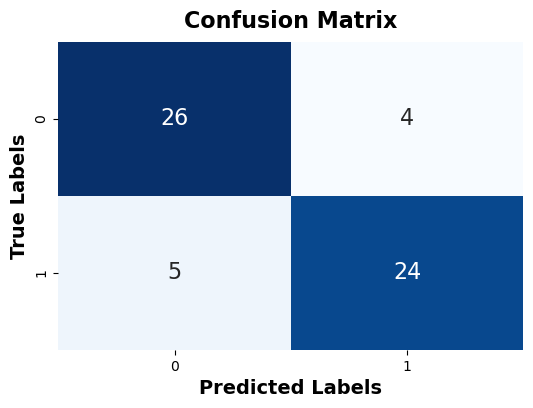

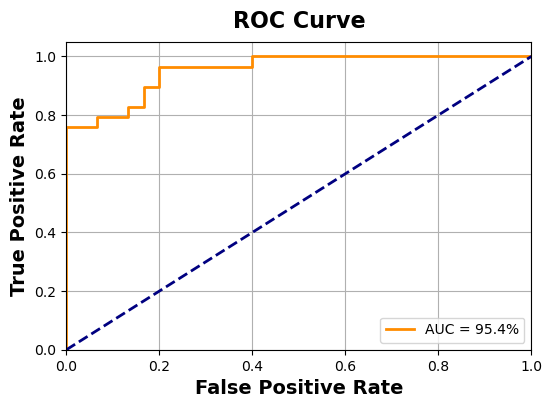

In [72]:
LR.fit(X_smote_train_scaled,y_smote_train)
y_pred_LR_smote = LR.predict(X_smote_test_scaled)
print('-'*80)
print("Logistic Regression :")
print("-"*16)
Evaluate_Performance(LR, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

--------------------------------------------------------------------------------
Support vector machine :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 83.4%
 ✅ Cross-Validation   : 79.22%
 ✅ Testing Accuracy   : 88.14%
 🔹 Precision Score    : 89.29%
 🔹 Recall Score       : 86.21%
 🔹 F1 Score           : 87.72%
 🔹 AUC-ROC Score      : 95.17%

📌 Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.90      0.89        30
           1       0.89      0.86      0.88        29

    accuracy                           0.88        59
   macro avg       0.88      0.88      0.88        59
weighted avg       0.88      0.88      0.88        59



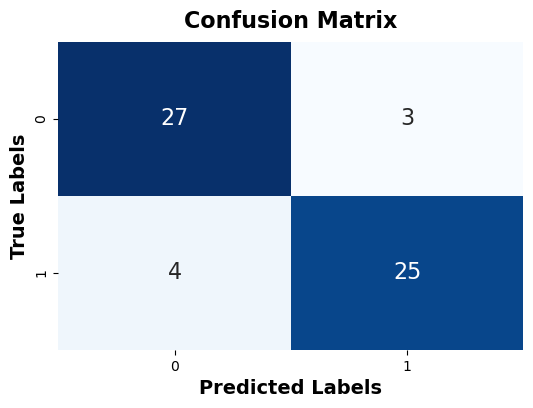

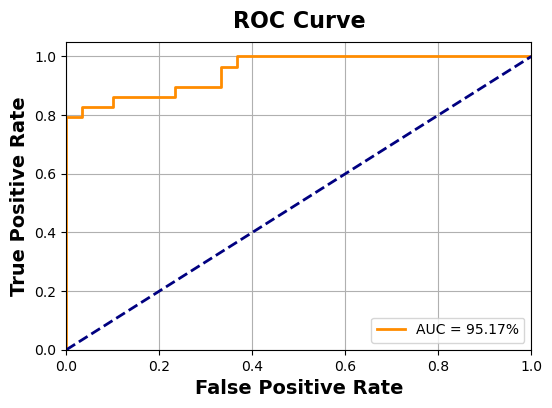

In [73]:
SVM.fit(X_smote_train_scaled,y_smote_train)
y_pred_SVM_smote = SVM.predict(X_smote_test_scaled)
print('-'*80)
print("Support vector machine :")
print("-"*16)
Evaluate_Performance(SVM, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

--------------------------------------------------------------------------------
Decision Tree Classifier :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 100.0%
 ✅ Cross-Validation   : 89.76%
 ✅ Testing Accuracy   : 98.31%
 🔹 Precision Score    : 100.0%
 🔹 Recall Score       : 96.55%
 🔹 F1 Score           : 98.25%
 🔹 AUC-ROC Score      : 98.28%

📌 Classification Report:

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.97      0.98        29

    accuracy                           0.98        59
   macro avg       0.98      0.98      0.98        59
weighted avg       0.98      0.98      0.98        59



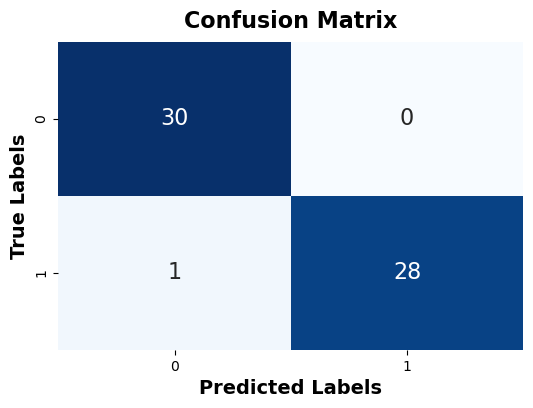

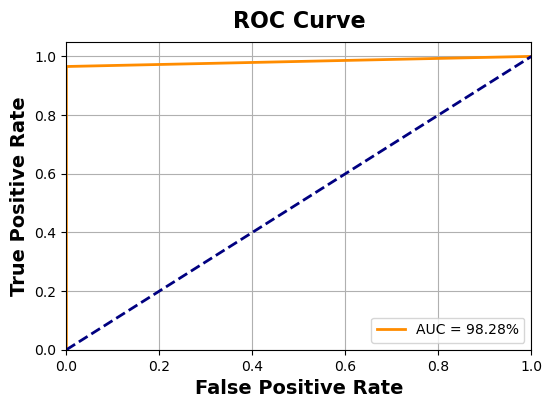

--> Tree's Depth :  6 

DECISION TREE :


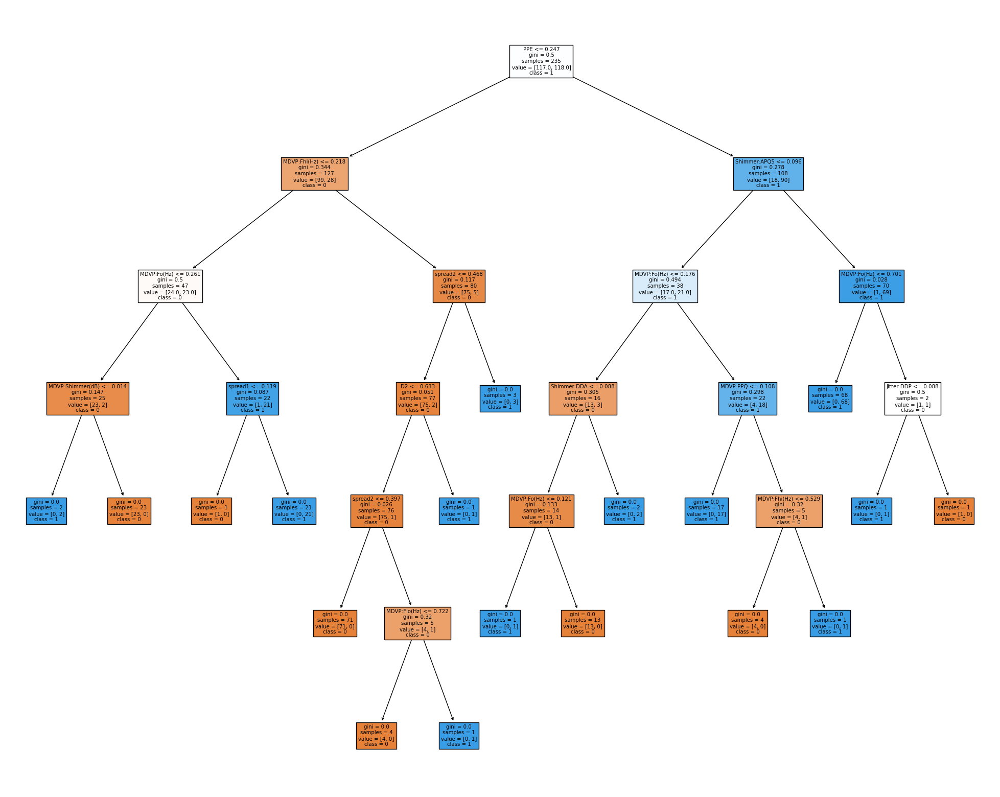

In [74]:
DTC = DecisionTreeClassifier(criterion='gini')
DTC.fit(X_smote_train_scaled,y_smote_train)
y_pred_DTC_smote = DTC.predict(X_smote_test_scaled)
print('-'*80)
print("Decision Tree Classifier :")
print("-"*16)
Evaluate_Performance(DTC, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)
print( '--> Tree\'s Depth : ',DTC.tree_.max_depth,'\n')
print("DECISION TREE :")
fig = plt.figure(figsize=(25,20))
tree = plot_tree(DTC, feature_names = [ c for c in smote_data.columns], class_names=['0','1'], filled=True)
plt.show()

--------------------------------------------------------------------------------
Random Forest Classifier :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 100.0%
 ✅ Cross-Validation   : 93.17%
 ✅ Testing Accuracy   : 100.0%
 🔹 Precision Score    : 100.0%
 🔹 Recall Score       : 100.0%
 🔹 F1 Score           : 100.0%
 🔹 AUC-ROC Score      : 100.0%

📌 Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        30
           1       1.00      1.00      1.00        29

    accuracy                           1.00        59
   macro avg       1.00      1.00      1.00        59
weighted avg       1.00      1.00      1.00        59



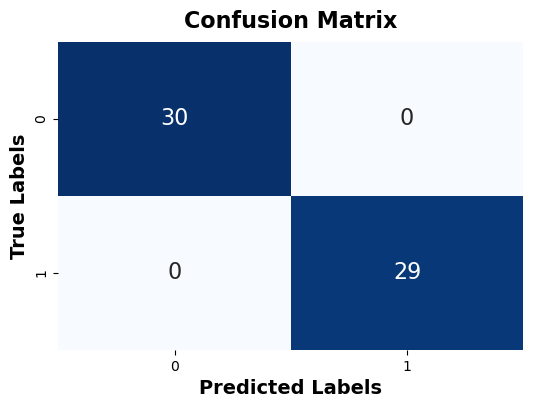

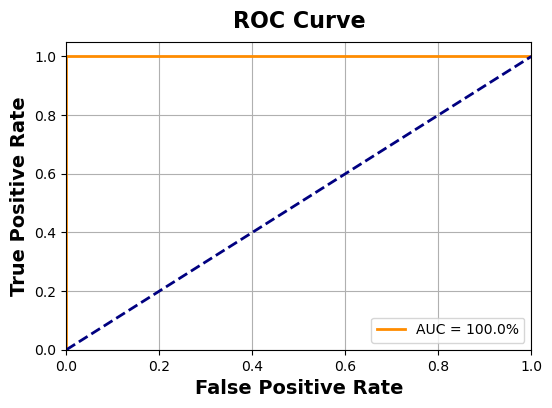

In [75]:
RFC.fit(X_smote_train_scaled,y_smote_train)
y_pred_RFC_smote = RFC.predict(X_smote_test_scaled)
print('-'*80)
print("Random Forest Classifier :")
print("-"*16)
Evaluate_Performance(RFC, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

--------------------------------------------------------------------------------
Random Forest Classifier :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 100.0%
 ✅ Cross-Validation   : 92.34%
 ✅ Testing Accuracy   : 100.0%
 🔹 Precision Score    : 100.0%
 🔹 Recall Score       : 100.0%
 🔹 F1 Score           : 100.0%
 🔹 AUC-ROC Score      : 100.0%

📌 Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        30
           1       1.00      1.00      1.00        29

    accuracy                           1.00        59
   macro avg       1.00      1.00      1.00        59
weighted avg       1.00      1.00      1.00        59



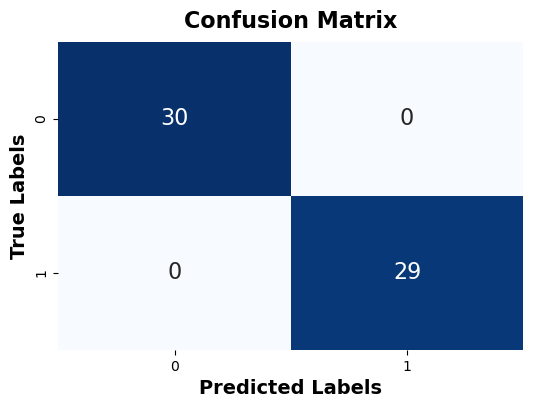

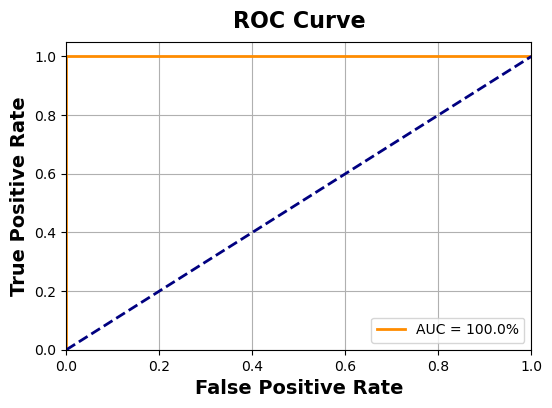

In [78]:
RFC.fit(X_smote_train_scaled,y_smote_train)
y_pred_RFC_smote = RFC.predict(X_smote_test_scaled)
print('-'*80)
print("Random Forest Classifier :")
print("-"*16)
Evaluate_Performance(RFC, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)


C:\Users\barat\AppData\Local\Temp\ipykernel_20900\1937795259.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importances[sorted_indices], y=X.columns[sorted_indices], palette="viridis")


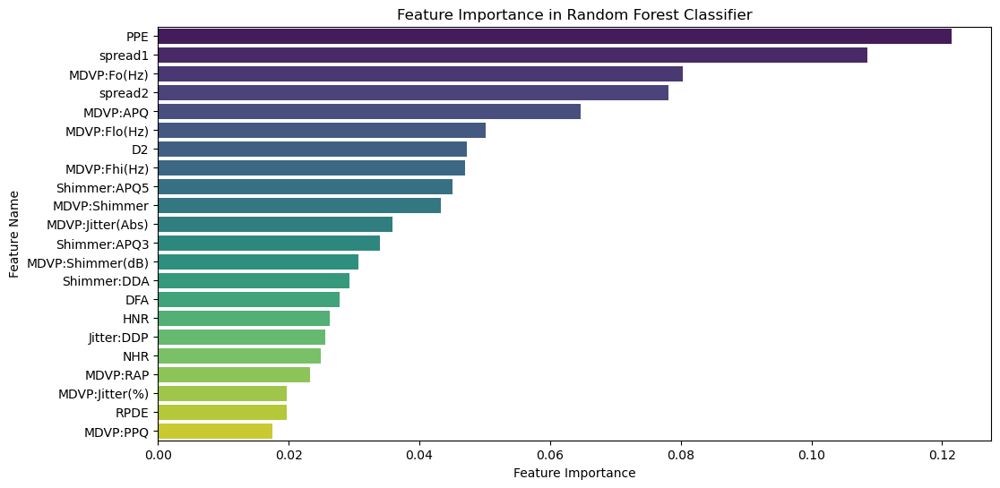

In [79]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importances from the trained Random Forest model
feature_importances = RFC.feature_importances_

# Sort features by importance
sorted_indices = np.argsort(feature_importances)[::-1]

# Plot the feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances[sorted_indices], y=X.columns[sorted_indices], palette="viridis")
plt.xlabel("Feature Importance")
plt.ylabel("Feature Name")
plt.title("Feature Importance in Random Forest Classifier")
plt.show()


In [81]:
     # Get feature importance scores
feature_importances = RFC.feature_importances_

# Convert to DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importance
print(feature_importance_df)


             Feature  Importance
21               PPE    0.121478
18           spread1    0.108541
0        MDVP:Fo(Hz)    0.080266
19           spread2    0.078083
12          MDVP:APQ    0.064637
2       MDVP:Flo(Hz)    0.050195
20                D2    0.047221
1       MDVP:Fhi(Hz)    0.046922
11      Shimmer:APQ5    0.045073
8       MDVP:Shimmer    0.043263
4   MDVP:Jitter(Abs)    0.035846
10      Shimmer:APQ3    0.033944
9   MDVP:Shimmer(dB)    0.030634
13       Shimmer:DDA    0.029274
17               DFA    0.027792
15               HNR    0.026215
7         Jitter:DDP    0.025583
14               NHR    0.024916
5           MDVP:RAP    0.023195
3     MDVP:Jitter(%)    0.019756
16              RPDE    0.019696
6           MDVP:PPQ    0.017469


In [82]:
# Set a threshold for feature selection (e.g., keep only features with importance > 0.02)
important_features = feature_importance_df[feature_importance_df['Importance'] > 0.02]['Feature'].tolist()

# Reduce dataset to important features only
X_selected = X[important_features]


In [83]:
# Re-split the dataset
X_train_sel, X_test_sel, y_train_sel, y_test_sel = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Train the model
rf_model_selected = RandomForestClassifier(random_state=42)
rf_model_selected.fit(X_train_sel, y_train_sel)

# Evaluate the model
y_pred_selected = rf_model_selected.predict(X_test_sel)
print("New Accuracy after Feature Selection:", accuracy_score(y_test_sel, y_pred_selected) * 100, "%")


New Accuracy after Feature Selection: 94.87179487179486 %


--------------------------------------------------------------------------------
Key- Nearest Neighbor :
----------------

📊 MODEL PERFORMANCE SUMMARY
 ✅ Training Accuracy  : 100.0%
 ✅ Cross-Validation   : 96.2%
 ✅ Testing Accuracy   : 98.31%
 🔹 Precision Score    : 100.0%
 🔹 Recall Score       : 96.55%
 🔹 F1 Score           : 98.25%
 🔹 AUC-ROC Score      : 98.28%

📌 Classification Report:

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.97      0.98        29

    accuracy                           0.98        59
   macro avg       0.98      0.98      0.98        59
weighted avg       0.98      0.98      0.98        59



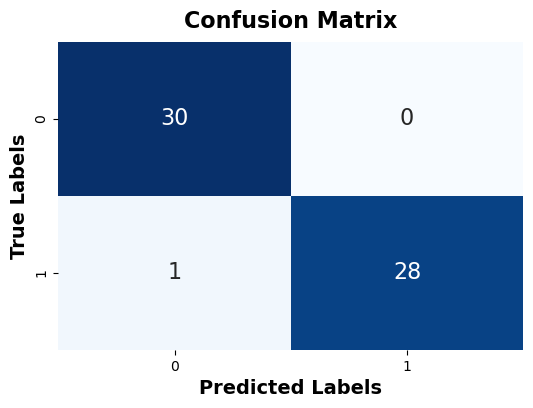

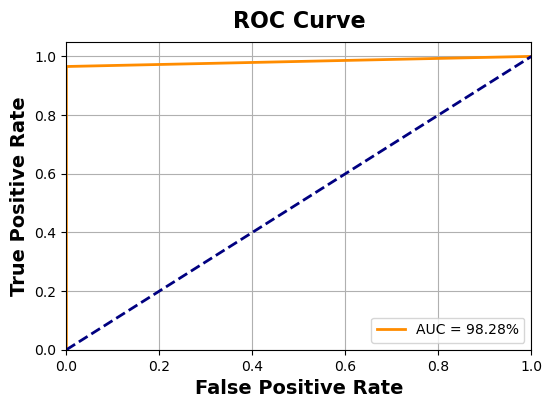

In [84]:
KNN = KNeighborsClassifier( n_neighbors = 1 ) 
KNN.fit(X_smote_train_scaled,y_smote_train)
y_pred_KNN_smote = KNN.predict(X_smote_test_scaled)
print('-'*80)
print("Key- Nearest Neighbor :")
print("-"*16)
Evaluate_Performance(KNN, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

In [94]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
results = [
    {'Model': 'Logistic Regression', 'Precision': precision_score(y_smote_test, y_pred_LR_smote) , 'Recall': recall_score(y_smote_test, y_pred_LR_smote) ,
     'F1-Score': f1_score(y_smote_test, y_pred_LR_smote) ,'Training Accuracy': LR.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_LR_smote)},
    
    {'Model': 'Support Vector Machine(rbf)', 'Precision': precision_score(y_smote_test, y_pred_SVM_smote), 'Recall': recall_score(y_smote_test, y_pred_SVM_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_SVM_smote),'Training Accuracy': SVM.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_SVM_smote)},
    
    {'Model': 'Decision Tree', 'Precision': precision_score(y_smote_test, y_pred_DTC_smote), 'Recall': recall_score(y_smote_test, y_pred_DTC_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_DTC_smote),'Training Accuracy': DTC.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_DTC_smote)},
    
    # ✅ Updated Random Forest Model (Feature Selection Applied)
    {'Model': 'Random Forest (Feature Selected)', 'Precision': precision_score(y_test_sel, y_pred_selected), 
     'Recall': recall_score(y_test_sel, y_pred_selected),
     'F1-Score': f1_score(y_test_sel, y_pred_selected),
     'Training Accuracy': rf_model_selected.score(X_train_sel, y_train_sel), 
     'Test Accuracy': accuracy_score(y_test_sel, y_pred_selected)},
    
    {'Model': 'K-Nearest Neighbor', 'Precision': precision_score(y_smote_test, y_pred_KNN_smote), 'Recall': recall_score(y_smote_test, y_pred_KNN_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_KNN_smote),'Training Accuracy': KNN.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_KNN_smote)},
]

# Convert to DataFrame
smote_results_df = pd.DataFrame(results)

# Sort models by Test Accuracy (for better visualization)
smote_results_df = smote_results_df.sort_values(by='Test Accuracy', ascending=False)

# Display DataFrame
print("Results after balancing the dataset using SMOTE Over Sampler technique : ")
print('-'*70)
display(smote_results_df)


Results after balancing the dataset using SMOTE Over Sampler technique : 
----------------------------------------------------------------------


,Model,Precision,Recall,F1-Score,Training Accuracy,Test Accuracy
4,K-Nearest Neighbor,1.000000,0.965517,0.982456,1.000000,0.983051
2,Decision Tree,0.965517,0.965517,0.965517,1.000000,0.966102
3,Random Forest (Feature Selected),0.941176,1.000000,0.969697,1.000000,0.948718
1,Support Vector Machine(rbf),0.892857,0.862069,0.877193,0.834043,0.881356
0,Logistic Regression,0.857143,0.827586,0.842105,0.795745,0.847458


<Figure size 1200x700 with 0 Axes>

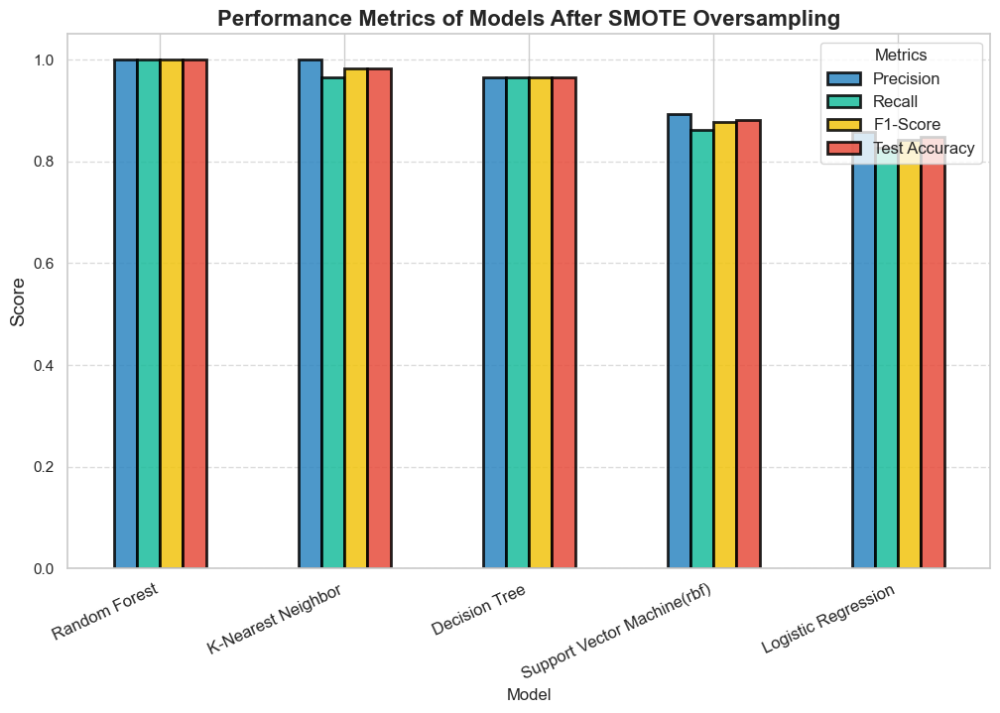

In [87]:
# Set seaborn style
sns.set_theme(style="whitegrid")

# Define colors for different metrics
colors = ['#2E86C1', '#1ABC9C', '#F1C40F', '#E74C3C']

# Plot the results
plt.figure(figsize=(12, 7))
smote_results_df.set_index('Model')[['Precision', 'Recall', 'F1-Score', 'Test Accuracy']].plot(
    kind='bar', figsize=(12, 7), color=colors, edgecolor='black', linewidth=2, alpha=0.85)

# Customizing the plot
plt.title('Performance Metrics of Models After SMOTE Oversampling', fontsize=16, fontweight='bold')
plt.ylabel('Score', fontsize=14)
plt.xticks(rotation=25, fontsize=12, ha='right')
plt.legend(title="Metrics", fontsize=12)
plt.ylim(0, 1.05)  # Keep the range between 0 and 1 for better readability

# Show grid for clarity
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


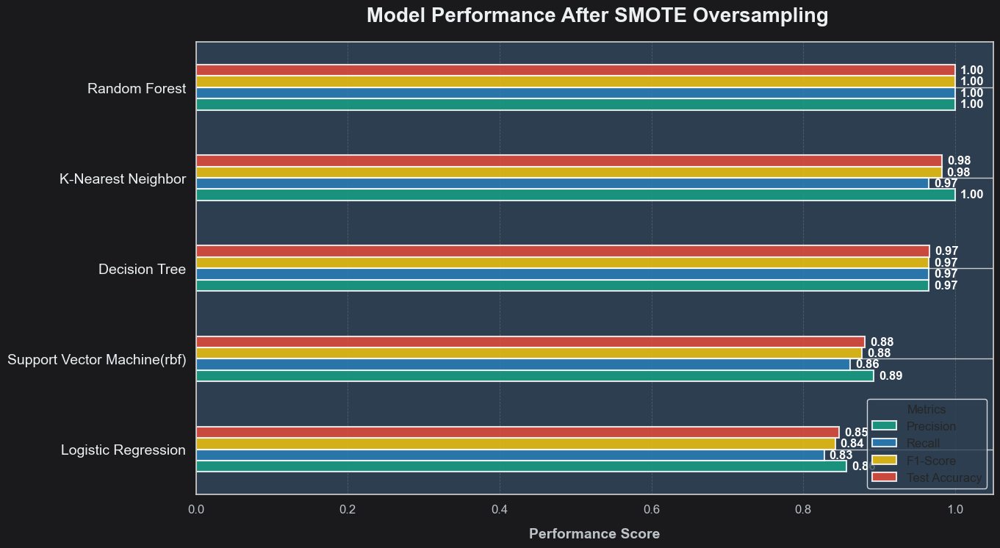

In [93]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set an elegant dark theme
plt.style.use("dark_background")
sns.set_theme(style="whitegrid")

# Convert results to DataFrame & sort
smote_results_df = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=True)

# Define an eye-catching color palette with gradients
colors = ["#16A085", "#2980B9", "#F1C40F", "#E74C3C"]
gradient = np.linspace(0.2, 1, len(smote_results_df))

# Create figure and axes
fig, ax = plt.subplots(figsize=(14, 8))

# Plot stacked horizontal bars with transparency
bars = smote_results_df.set_index("Model")[["Precision", "Recall", "F1-Score", "Test Accuracy"]].plot(
    kind="barh",
    ax=ax,
    color=colors,
    alpha=0.85,  # Subtle transparency
    edgecolor="white",
    linewidth=1.5
)

# Add annotations with a glow effect
for container in ax.containers:
    ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=12, padding=5, color="white", fontweight="bold")

# Title & labels with better spacing
ax.set_title(" Model Performance After SMOTE Oversampling", fontsize=20, fontweight="bold", color="#ECF0F1", pad=20)
ax.set_xlabel("Performance Score", fontsize=14, fontweight="bold", color="#BDC3C7", labelpad=12)
ax.set_ylabel("")  # Remove y-label for a clean look

# Customize ticks and legend
ax.tick_params(axis="x", colors="#BDC3C7", labelsize=12)
ax.tick_params(axis="y", colors="#ECF0F1", labelsize=14)
ax.legend(title="Metrics", fontsize=12, loc="lower right", facecolor="#2C3E50", edgecolor="white", framealpha=0.8)

# Add a background gradient to the entire figure
fig.patch.set_facecolor("#1A1A1D")  
ax.set_facecolor("#2C3E50")  

# Soft grid lines
ax.grid(axis="x", linestyle="--", linewidth=0.6, alpha=0.5, color="gray")

# Show the improved visualization
plt.show()
